In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns

In [2]:
#scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler
#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
#evaluation
from sklearn.metrics import silhouette_score
#import dataset
from sklearn.datasets import load_iris

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform
# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

from sklearn.preprocessing import MinMaxScaler
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
import matplotlib.cm as cm
import seaborn as sns

In [3]:
df=pd.read_csv("file_train_senza_outliers.csv", skipinitialspace=True )

In [4]:
df

,name,duration_ms,explicit,artists,album_name,danceability,energy,key,loudness,mode,...,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
0,Long Road,241.76,False,Funki Porcini,Hed Phone Sex,0.69,0.51,5,-12.53,1.0,...,0.30,0.54,0.28,0.64,142.22,4.0000,567.0,141.0,1.28,j-dance
1,"Daniâl My Son, Where Did You Vanish?",444.00,False,Siavash Amini,A Trail of Laughters,0.07,0.20,1,-24.80,0.0,...,0.28,0.93,0.36,0.03,75.60,4.0000,617.0,155.0,2.37,iranian
2,Ondskapens Galakse,333.51,False,Kvelertak,Nattesferd,0.36,0.85,2,-7.44,1.0,...,0.00,0.80,0.26,0.49,116.63,4.0000,652.0,162.0,3.70,black-metal
3,Can't Look Away,269.80,False,The Wood Brothers,One Drop of Truth,0.52,0.58,5,-5.61,1.0,...,0.07,0.00,0.12,0.38,140.88,4.0000,619.0,155.0,1.28,bluegrass
4,Thunderground,307.65,False,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.64,0.69,7,-11.34,1.0,...,0.00,0.10,0.30,0.64,143.96,4.0000,733.0,183.0,4.07,happy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13542,Outpt,432.03,False,Autechre,EP7,0.55,0.66,1,-14.23,1.0,...,0.02,0.62,0.13,0.03,117.32,3.9201,837.0,212.0,2.37,idm
13543,Natural Environment Sounds: To Improve Sleep a...,182.75,False,Natural White Noise Relaxation,Baby Sleep White Noise: Ultimate Album to Help...,0.10,0.86,1,-19.63,1.0,...,0.55,0.94,0.12,0.00,92.32,3.0000,277.0,92.0,2.37,sleep
13544,Psychological Attack,400.09,False,Droplex,Psychological Attack,0.80,0.54,1,-9.10,1.0,...,0.00,0.86,0.07,0.07,126.00,4.0000,837.0,209.0,2.37,techno
13545,Don't Hate The 808 (feat. Lafa Taylor),197.25,False,Bassnectar;Lafa Taylor,Noise vs Beauty,0.51,0.97,5,-2.30,1.0,...,0.00,0.00,0.40,0.27,160.04,4.0000,513.0,130.0,1.28,breakbeat


In [5]:
df.columns

Index(['name', 'duration_ms', 'explicit', 'artists', 'album_name',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature', 'n_beats', 'n_bars', 'processing', 'genre'],
      dtype='object')

In [6]:
dk=df.drop(['name', 'explicit', 'artists','key', 'mode', 'album_name', 'genre'], axis=1) #tolgo variabili categoriali

In [7]:
dk.values # valori continui

array([[2.4176e+02, 6.9000e-01, 5.1000e-01, ..., 5.6700e+02, 1.4100e+02,
        1.2800e+00],
       [4.4400e+02, 7.0000e-02, 2.0000e-01, ..., 6.1700e+02, 1.5500e+02,
        2.3700e+00],
       [3.3351e+02, 3.6000e-01, 8.5000e-01, ..., 6.5200e+02, 1.6200e+02,
        3.7000e+00],
       ...,
       [4.0009e+02, 8.0000e-01, 5.4000e-01, ..., 8.3700e+02, 2.0900e+02,
        2.3700e+00],
       [1.9725e+02, 5.1000e-01, 9.7000e-01, ..., 5.1300e+02, 1.3000e+02,
        1.2800e+00],
       [1.9841e+02, 6.8000e-01, 5.2000e-01, ..., 2.8600e+02, 7.2000e+01,
        1.1700e+00]])

In [8]:

X = dk.values
genres = sorted(df['genre'].unique())
y_mapped = dict(zip(genres, range(0, len(genres) + 1)))
y_mapped

{'afrobeat': 0,
 'black-metal': 1,
 'bluegrass': 2,
 'brazil': 3,
 'breakbeat': 4,
 'chicago-house': 5,
 'disney': 6,
 'forro': 7,
 'happy': 8,
 'idm': 9,
 'indian': 10,
 'industrial': 11,
 'iranian': 12,
 'j-dance': 13,
 'j-idol': 14,
 'mandopop': 15,
 'sleep': 16,
 'spanish': 17,
 'study': 18,
 'techno': 19}

In [9]:
X

array([[2.4176e+02, 6.9000e-01, 5.1000e-01, ..., 5.6700e+02, 1.4100e+02,
        1.2800e+00],
       [4.4400e+02, 7.0000e-02, 2.0000e-01, ..., 6.1700e+02, 1.5500e+02,
        2.3700e+00],
       [3.3351e+02, 3.6000e-01, 8.5000e-01, ..., 6.5200e+02, 1.6200e+02,
        3.7000e+00],
       ...,
       [4.0009e+02, 8.0000e-01, 5.4000e-01, ..., 8.3700e+02, 2.0900e+02,
        2.3700e+00],
       [1.9725e+02, 5.1000e-01, 9.7000e-01, ..., 5.1300e+02, 1.3000e+02,
        1.2800e+00],
       [1.9841e+02, 6.8000e-01, 5.2000e-01, ..., 2.8600e+02, 7.2000e+01,
        1.1700e+00]])

## Normalization

In [10]:
# z-score, fit and then transform
scaler = StandardScaler()
scaler.fit(X) ## addestra
X_scal = scaler.transform(X) 

In [11]:
# min-max, fit and trasform directly
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(X)

In [12]:
X_minmax

array([[0.36259002, 0.68817204, 0.51      , ..., 0.40706605, 0.38662791,
        0.15963855],
       [0.69512315, 0.02150538, 0.2       , ..., 0.44546851, 0.42732558,
        0.48795181],
       [0.51344997, 0.33333333, 0.85      , ..., 0.47235023, 0.44767442,
        0.88855422],
       ...,
       [0.62292413, 0.80645161, 0.54      , ..., 0.61443932, 0.58430233,
        0.48795181],
       [0.28940445, 0.49462366, 0.97      , ..., 0.3655914 , 0.35465116,
        0.15963855],
       [0.29131178, 0.67741935, 0.52      , ..., 0.19124424, 0.18604651,
        0.12650602]])

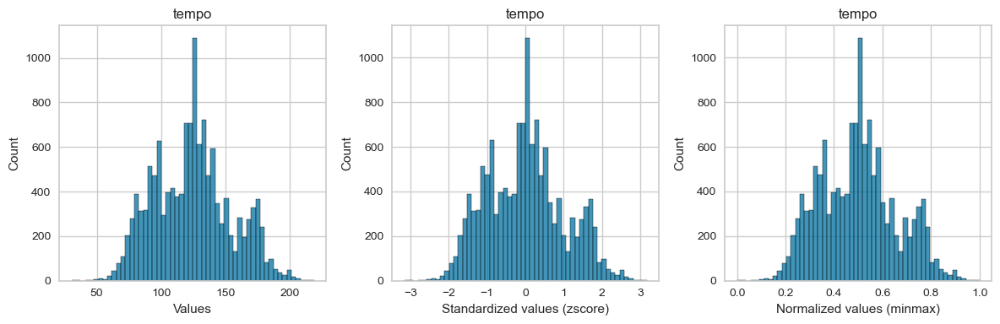

In [13]:
i = 9 # column index
fig, axs = plt.subplots(1,3, figsize=(12, 4)) # 1 row, 3 columns

sns.histplot(X[:,i], ax=axs[0]).set(title=dk.columns[i])
axs[0].set(xlabel='Values')

sns.histplot(X_scal[:,i], ax=axs[1]).set(title=dk.columns[i])
axs[1].set(xlabel='Standardized values (zscore)')

sns.histplot(X_minmax[:,i], ax=axs[2]).set(title=dk.columns[i])
axs[2].set(xlabel='Normalized values (minmax)')

plt.tight_layout() # Adjust the padding between and around subplots

## Identification of k

/Users/isabelsantucci/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/isabelsantucci/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/isabelsantucci/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/isabelsantucci/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: 

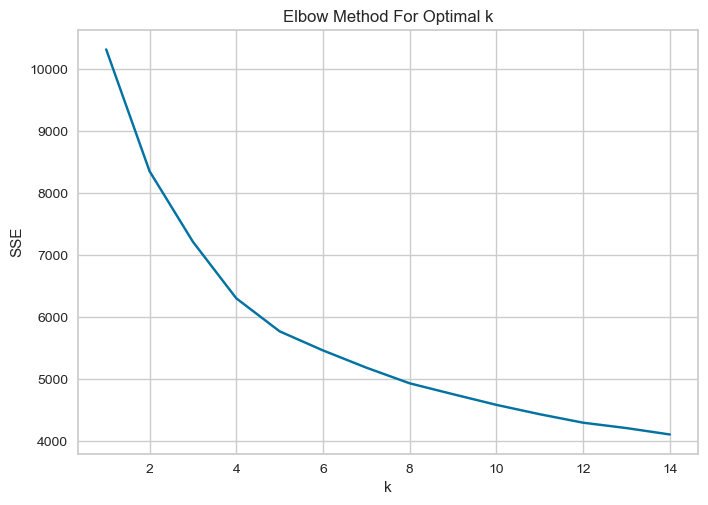

In [14]:

Sum_of_squared_distances =[]
K = range(1,15)
for k in K:
    km =KMeans(n_clusters =k)
    km =km.fit(X_minmax)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('SSE')
plt.title('Elbow Method For Optimal k')
plt.show()

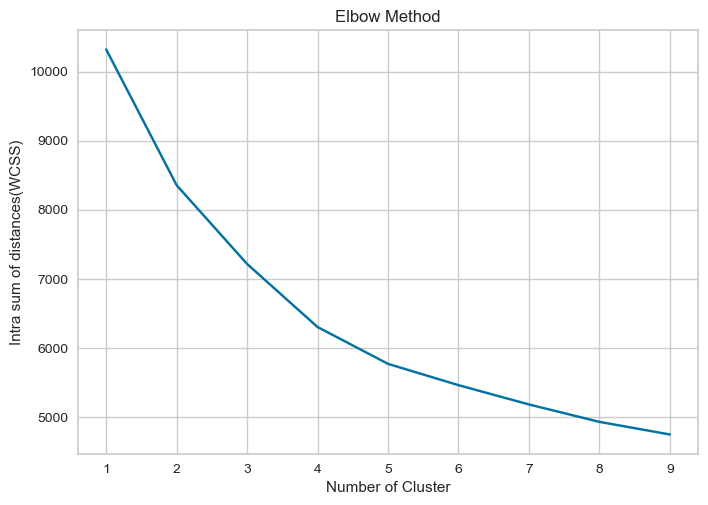

In [15]:
max_cluster = 10
clusters = range(1,max_cluster)
intra_sum_of_square_list = []
for k in clusters:
    km = KMeans(n_clusters=k,n_init=10,max_iter=300)
    km.fit(X_minmax)
    intra_sum_of_square_list.append(km.inertia_)
fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.set_title("Elbow Method")
ax.set_xlabel("Number of Cluster")
ax.set_ylabel("Intra sum of distances(WCSS)")
plt.plot(clusters,intra_sum_of_square_list)

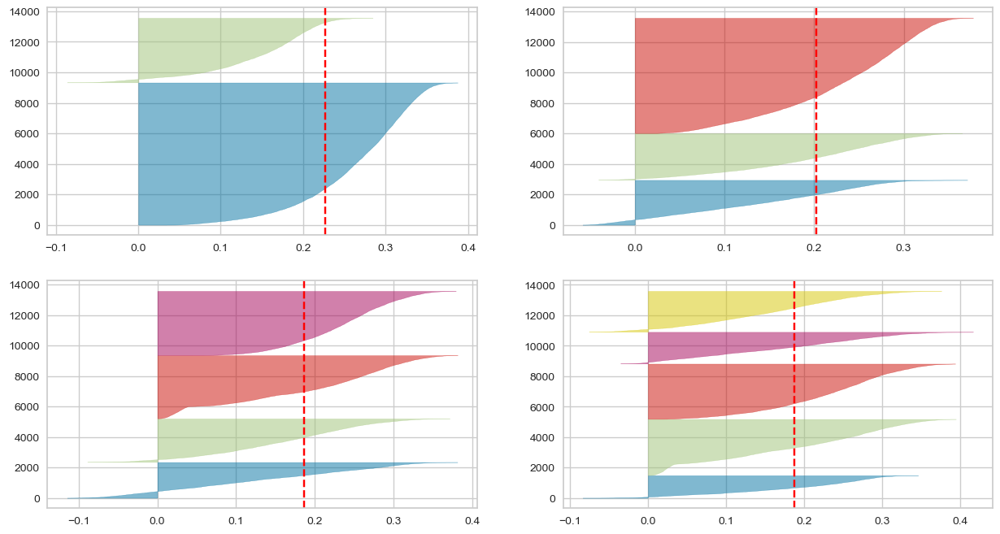

In [16]:
from yellowbrick.cluster import SilhouetteVisualizer
 
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    
    km = KMeans(n_clusters=i, n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
   
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(X_minmax)
plt.savefig('silhouette_grafico.png', dpi=200) 

/Users/isabelsantucci/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/isabelsantucci/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/isabelsantucci/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/isabelsantucci/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: 

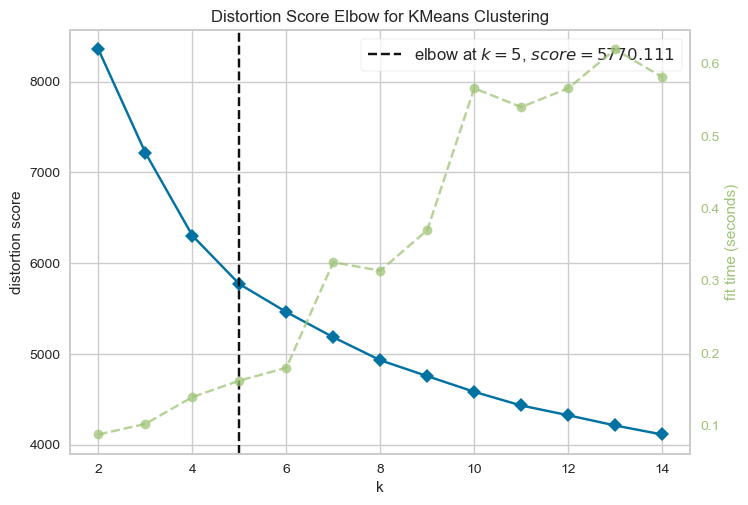

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [17]:
from sklearn import datasets
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
import matplotlib.pyplot as plt

# Carica il dataset IRIS o i dati X_minmax

# Istanzia il modello di clustering e il visualizer dell'Elbow Method
km = KMeans()
visualizer = KElbowVisualizer(km, k=(2, 15))

visualizer.fit(X_minmax)  # Adatta i dati al visualizer
visualizer.show()  # Visualizza il grafico


/Users/isabelsantucci/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/isabelsantucci/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/isabelsantucci/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/isabelsantucci/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: 

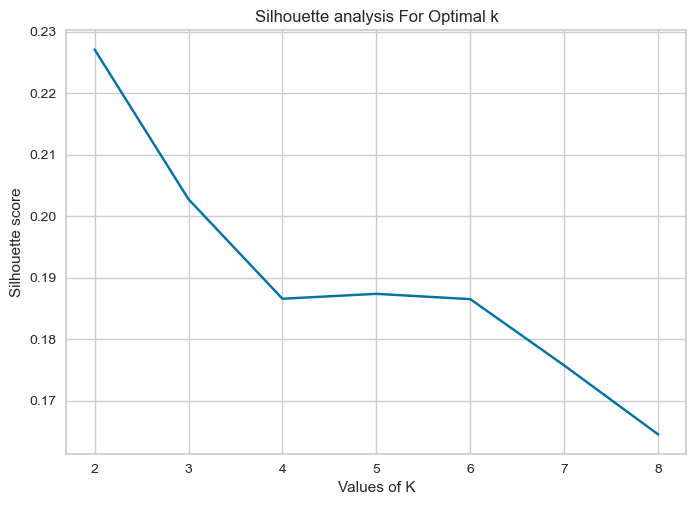

In [18]:
from sklearn.metrics import silhouette_score

sil_avg = []
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for k in range_n_clusters:
    kmeans = KMeans(n_clusters = k).fit(X_minmax)
    labels = kmeans.labels_
    sil_avg.append(silhouette_score(X_minmax, labels, metric = 'euclidean'))

plt.plot(range_n_clusters,sil_avg,'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')
plt.show()

## K means

In [59]:
kmeans = KMeans(n_clusters=5, n_init=10, max_iter=100, random_state=94)# importanza di random state per ottenere gli stessi risultati
kmeans.fit(X_minmax)

KMeans(max_iter=100, n_clusters=5, n_init=10, random_state=94)

In [60]:
kmeans.labels_

array([3, 2, 3, ..., 3, 4, 4], dtype=int32)

In [61]:
# ndarray of shape (n_clusters, n_features)
kmeans.cluster_centers_ ##centroidi

array([[0.32747799, 0.51390291, 0.39337025, 0.54201695, 0.10216057,
        0.71370727, 0.02057294, 0.20270839, 0.37860857, 0.44493392,
        0.70924317, 0.28773592, 0.28846251, 0.42750057],
       [0.35826969, 0.58696204, 0.77550583, 0.69700227, 0.19647579,
        0.15833198, 0.04146461, 0.25650507, 0.54253322, 0.52346917,
        0.74123991, 0.35955137, 0.34750553, 0.78661268],
       [0.28700388, 0.44681376, 0.32074949, 0.37807214, 0.14164838,
        0.73765699, 0.857684  , 0.1780699 , 0.25988521, 0.4083709 ,
        0.69652229, 0.2329699 , 0.23738674, 0.46210433],
       [0.45864957, 0.56417296, 0.77731243, 0.62039924, 0.160426  ,
        0.05830534, 0.79089586, 0.20943012, 0.35964912, 0.52469899,
        0.73381586, 0.46162621, 0.44810303, 0.40222817],
       [0.35549808, 0.58917786, 0.78160916, 0.69678947, 0.20420749,
        0.16041954, 0.0379989 , 0.26332468, 0.54753243, 0.52527903,
        0.74168431, 0.35780576, 0.34544801, 0.09865019]])

In [62]:
centers = scaler.inverse_transform(kmeans.cluster_centers_)# stesso scaler anche per i k
centers

array([[ 2.20405566e+02,  5.27929706e-01,  3.93370246e-01,
        -1.06115503e+01,  5.26913818e-02,  7.13707270e-01,
         2.05729417e-02,  1.70139624e-01,  3.78608570e-01,
         1.14216740e+02,  3.83697267e+00,  4.11632162e+02,
         1.07231103e+02,  2.16930188e+00],
       [ 2.39132460e+02,  5.95874695e-01,  7.75505831e-01,
        -5.95114185e+00,  8.28722539e-02,  1.58331977e-01,
         4.14646054e-02,  2.12639002e-01,  5.42533225e-01,
         1.29025346e+02,  3.96495962e+00,  5.05135883e+02,
         1.27541904e+02,  3.36155411e+00],
       [ 1.95790020e+02,  4.65536799e-01,  3.20749494e-01,
        -1.55413707e+01,  6.53274814e-02,  7.37656989e-01,
         8.57683997e-01,  1.50675219e-01,  2.59885213e-01,
         1.07322417e+02,  3.78608914e+00,  3.40326806e+02,
         8.96610398e+01,  2.28418636e+00],
       [ 3.00181497e+02,  5.74680851e-01,  7.77312430e-01,
        -8.25459500e+00,  7.13363195e-02,  5.83053378e-02,
         7.90895857e-01,  1.75449795e-01,  3.

In [63]:
dk['kmeans_labels'] = kmeans.labels_
dk['kmeans_labels'] = dk['kmeans_labels'].map({0:"A", 1:'B', 2:"C", 3:'D', 4:'E'})

In [64]:
dk[['kmeans_labels']]

,kmeans_labels
0,D
1,C
2,D
3,E
4,B
...,...
13542,D
13543,C
13544,D
13545,E


In [65]:
dk

,duration_ms,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,kmeans_labels
0,241.76,0.69,0.51,-12.53,0.10,0.30,0.54,0.28,0.64,142.22,4.0000,567.0,141.0,1.28,D
1,444.00,0.07,0.20,-24.80,0.08,0.28,0.93,0.36,0.03,75.60,4.0000,617.0,155.0,2.37,C
2,333.51,0.36,0.85,-7.44,0.04,0.00,0.80,0.26,0.49,116.63,4.0000,652.0,162.0,3.70,D
3,269.80,0.52,0.58,-5.61,0.08,0.07,0.00,0.12,0.38,140.88,4.0000,619.0,155.0,1.28,E
4,307.65,0.64,0.69,-11.34,0.05,0.00,0.10,0.30,0.64,143.96,4.0000,733.0,183.0,4.07,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13542,432.03,0.55,0.66,-14.23,0.06,0.02,0.62,0.13,0.03,117.32,3.9201,837.0,212.0,2.37,D
13543,182.75,0.10,0.86,-19.63,0.06,0.55,0.94,0.12,0.00,92.32,3.0000,277.0,92.0,2.37,C
13544,400.09,0.80,0.54,-9.10,0.06,0.00,0.86,0.07,0.07,126.00,4.0000,837.0,209.0,2.37,D
13545,197.25,0.51,0.97,-2.30,0.05,0.00,0.00,0.40,0.27,160.04,4.0000,513.0,130.0,1.28,E


## Non correlazioni 

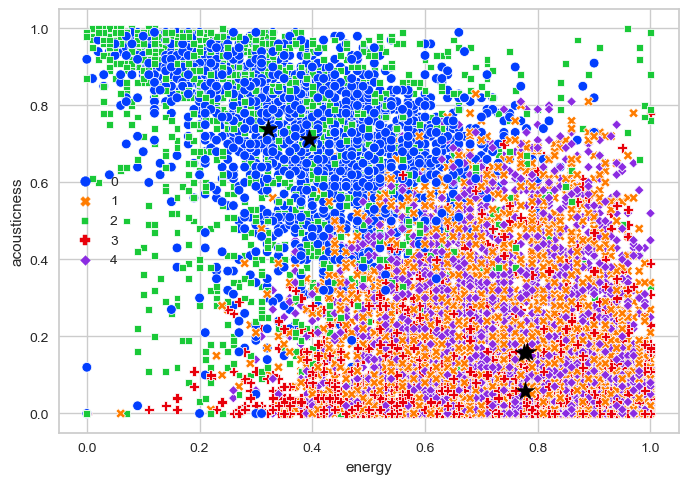

<Figure size 800x550 with 0 Axes>

In [126]:
sns.scatterplot(data=dk, x="energy", y="acousticness",  hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.legend()
plt.scatter(centers[:,2], centers[:,5], c='black', marker='*', s=200) #prendo le colonne e fisso i centroidi
plt.show()

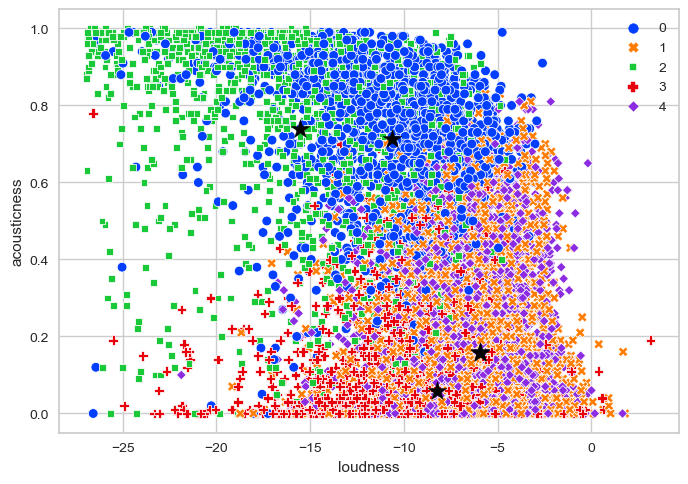

<Figure size 800x550 with 0 Axes>

In [128]:
sns.scatterplot(data=dk, x="loudness", y="acousticness",  hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.legend()
plt.scatter(centers[:,3], centers[:,5], c='black', marker='*', s=200) #prendo le colonne e fisso i centroidi
plt.show()

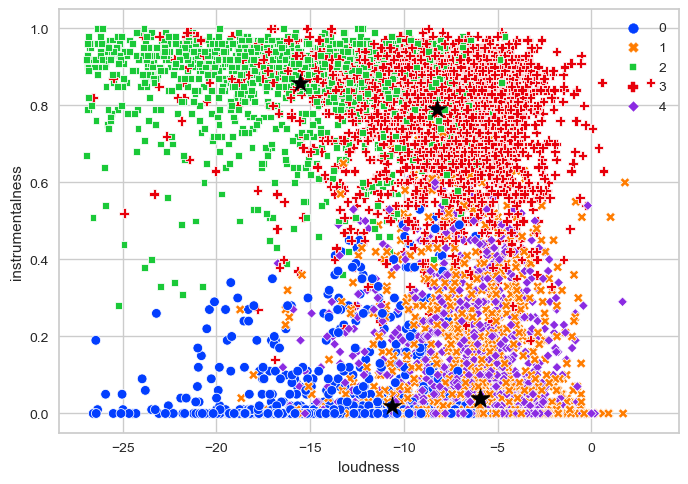

<Figure size 800x550 with 0 Axes>

In [129]:
sns.scatterplot(data=dk, x="loudness", y="instrumentalness",  hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.legend()
plt.scatter(centers[:,3], centers[:,6], c='black', marker='*', s=200) #prendo le colonne e fisso i centroidi
plt.show()

## Correlazioni

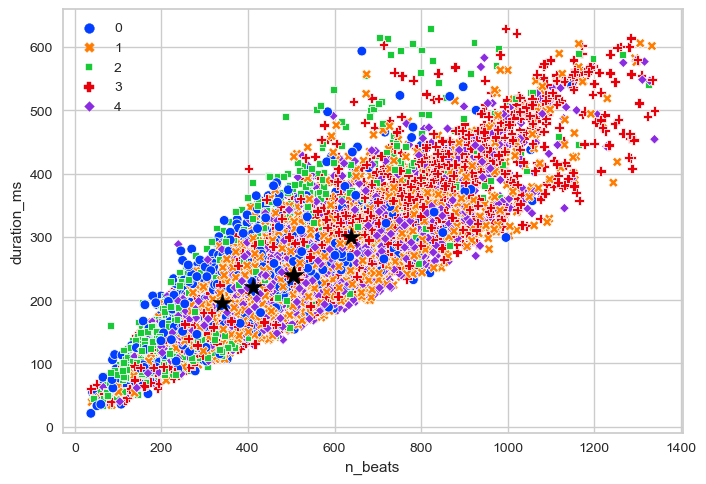

In [69]:
sns.scatterplot(data=dk, x="n_beats", y="duration_ms",  hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.legend()
plt.scatter(centers[:,11], centers[:,0], c='black', marker='*', s=200) #prendo le colonne e fisso i centroidi
plt.show()

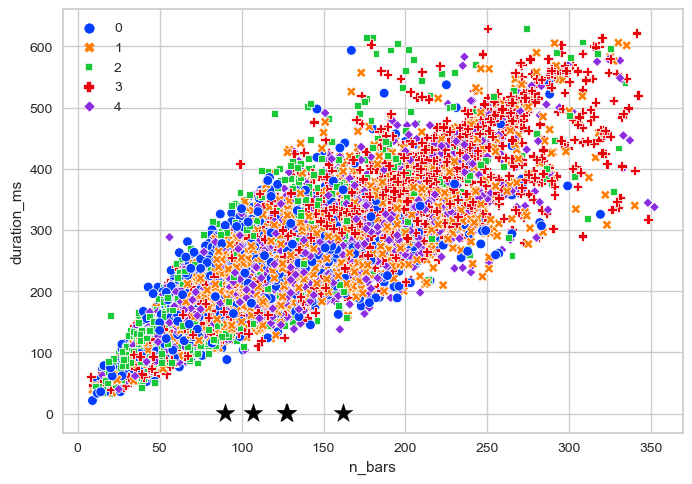

In [70]:
sns.scatterplot(data=dk, x="n_bars", y="duration_ms",  hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.legend()
plt.scatter(centers[:,12], centers[:,2], c='black', marker='*', s=200) #prendo le colonne e fisso i centroidi
plt.show()

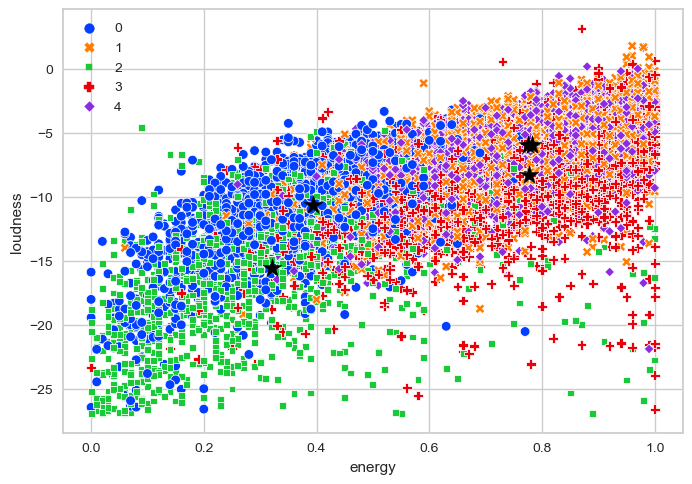

In [71]:
sns.scatterplot(data=dk, x="energy", y="loudness",  hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.legend()
plt.scatter(centers[:,2], centers[:,3], c='black', marker='*', s=200) #prendo le colonne e fisso i centroidi
plt.show()

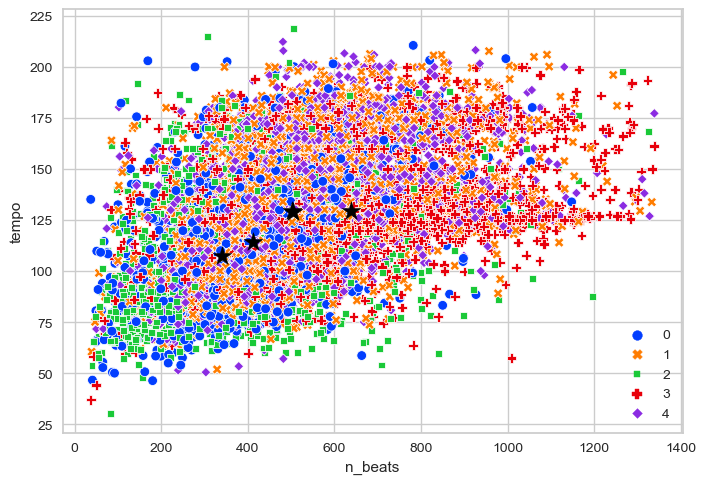

In [72]:
sns.scatterplot(data=dk, x="n_beats", y="tempo",  hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.legend()
plt.scatter(centers[:,11], centers[:,9], c='black', marker='*', s=200) #prendo le colonne e fisso i centroidi
plt.show()

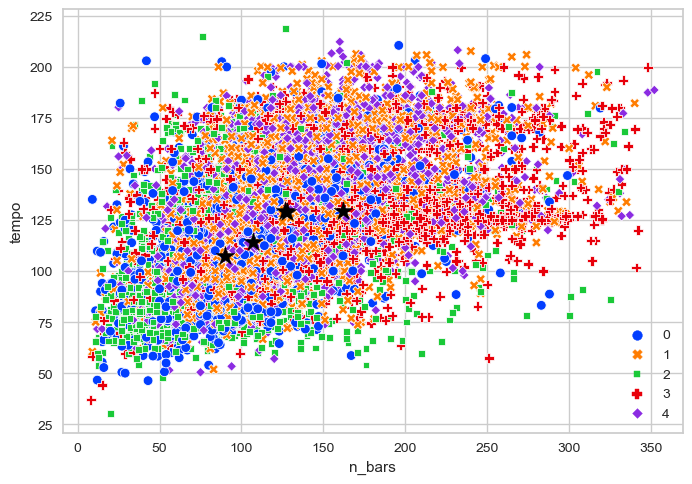

In [73]:
sns.scatterplot(data=dk, x="n_bars", y='tempo',  hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.legend()
plt.scatter(centers[:,12], centers[:,9], c='black', marker='*', s=200) #prendo le colonne e fisso i centroidi
plt.show()

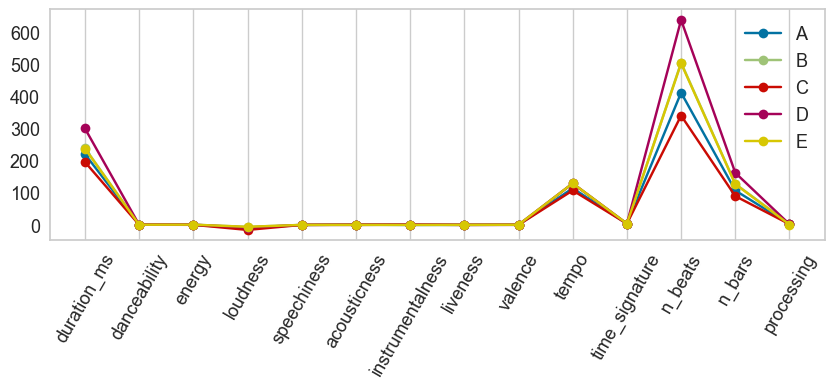

In [130]:
plt.figure(figsize=(10, 3)) ##grafico per i centroidi

clust_name = ['A', 'B', 'C', 'D', 'E']
for i in range(len(centers)):
    plt.plot(centers[i], marker='o', label=clust_name[i])
    
plt.xticks(range(0, len(dk.columns) - 1), dk.columns[:-1], fontsize=13, rotation=60)

plt.yticks(fontsize=13)

plt.legend(fontsize=13, loc='best')
plt.grid(axis='y')

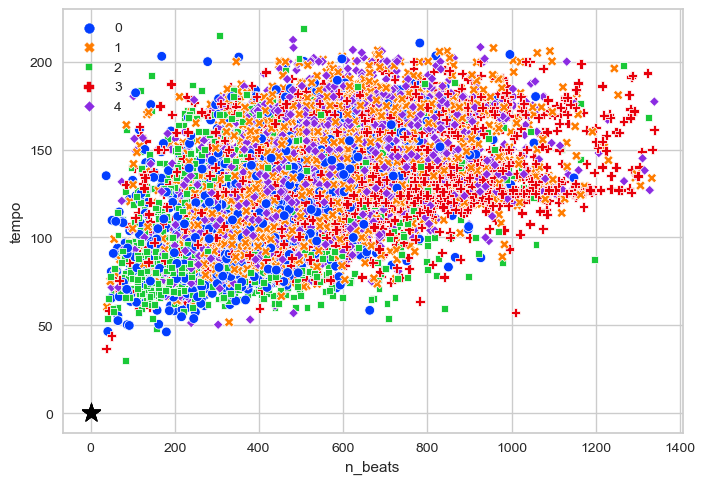

In [75]:
sns.scatterplot(data=dk, x="n_beats", y="tempo",  hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.legend()
plt.scatter(centers[:,2], centers[:,5], c='black', marker='*', s=200) #prendo le colonne e fisso i centroidi
plt.show()

In [37]:
#y_mapped.groupby(dk['kmeans_labels']).value_counts(normalize=True)# normalize per avere tutto in percentuale

In [38]:
%%time
sse_list = []
## vediamo come cambia sse in relazione alle iterazioni
for k in range(2, 100): # 1 è inutile, vuol dire avere tutto insieme. 51 non è obbligatorio, si può mettere anche 100, visualizziamo di più sulla x
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X_minmax)
    sse_list.append(kmeans.inertia_)

KeyboardInterrupt: 

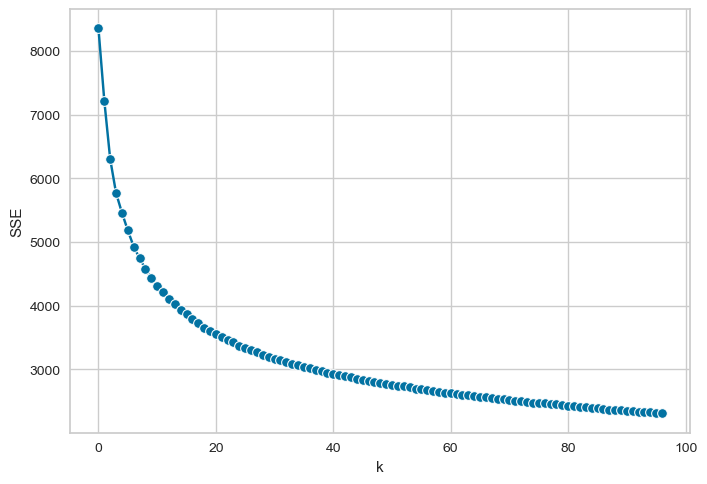

In [39]:
sns.lineplot(x=range(len(sse_list)), y=sse_list, marker='o')
plt.ylabel('SSE')
plt.xlabel('k')
plt.show() # cosa sse sta facendo 

In [44]:
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

sil_list = []

dist = squareform(pdist(X_minmax, metric='euclidean'))  # Calcola la matrice delle distanze

for k in range(2, 51):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X_minmax)
    silhouette_avg = silhouette_score(dist, kmeans.labels_, metric='precomputed')
    sil_list.append(silhouette_avg)


In [76]:
from sklearn.metrics import silhouette_score

# X è il tuo dataset
# labels sono le etichette di cluster assegnate a ciascuna osservazione
silhouette_avg = silhouette_score(X_minmax, kmeans.labels_)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.18733740382818911


In [77]:
print('SSE', kmeans.inertia_) 
print('Silhouette', silhouette_score(X_minmax, kmeans.labels_))

SSE 5770.111446525717
Silhouette 0.18733740382818911


In [ ]:
from sklearn.metrics import silhouette_score
silhouettes = []
kmin = 2
kmax = 10
for k in range(kmin, kmax+1):
# We fit the KMeans algo with k clusters
    kmeans = KMeans(n_clusters = k).fit(X_minmax)
    labels = kmeans.labels_
# We calculate the silhouette score and append it to the silhouette list
    silhouettes.append(silhouette_score(X_minmax, labels, metric = 'euclidean'))
plt.plot(range(kmin,kmax+1),silhouettes)
plt.show()

## Bisecting K means

In [78]:
from sklearn.cluster import BisectingKMeans

In [90]:
bkmeans = BisectingKMeans(n_clusters=5, n_init=10, max_iter=100, random_state=94)
bkmeans.fit(X_minmax)

BisectingKMeans(max_iter=100, n_clusters=5, n_init=10, random_state=94)

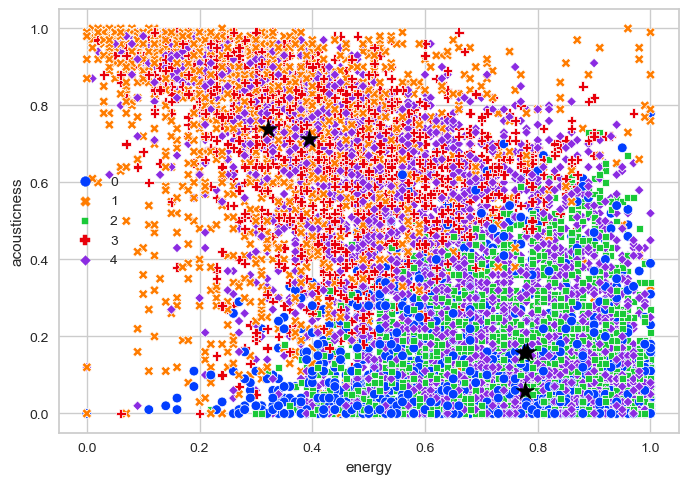

In [91]:
sns.scatterplot(data=dk, 
                x="energy", 
                y="acousticness", 
                hue=bkmeans.labels_, 
                style=bkmeans.labels_,
                palette="bright",)
plt.legend()
plt.scatter(centers[:,2], centers[:,5], c='black', marker='*', s=200)
plt.show()

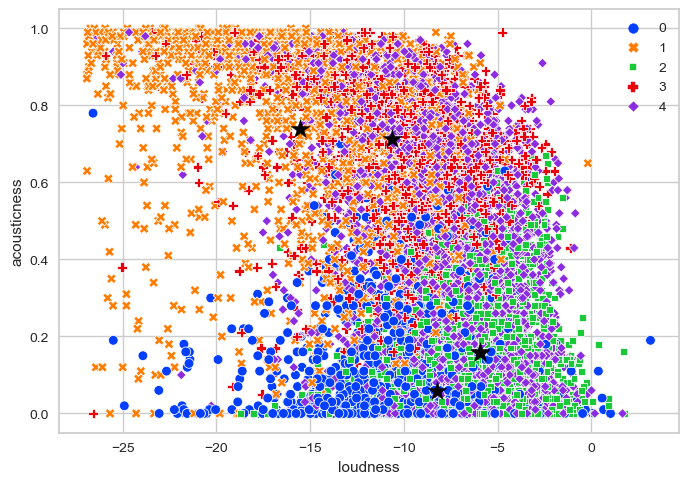

In [92]:
sns.scatterplot(data=dk, 
                x="loudness", 
                y="acousticness", 
                hue=bkmeans.labels_, 
                style=bkmeans.labels_,
                palette="bright",)
plt.legend()
plt.scatter(centers[:,3], centers[:,5], c='black', marker='*', s=200)
plt.show()

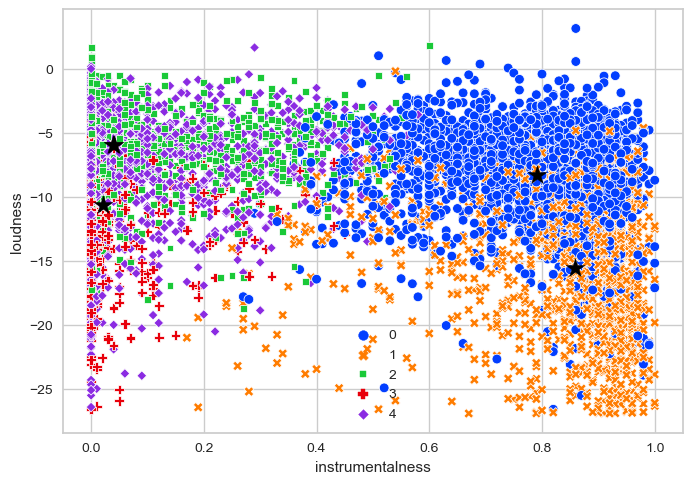

In [94]:
sns.scatterplot(data=dk, 
                x="instrumentalness", 
                y="loudness", 
                hue=bkmeans.labels_, 
                style=bkmeans.labels_,
                palette="bright",)
plt.legend()
plt.scatter(centers[:,6], centers[:,3], c='black', marker='*', s=200)
plt.show()

## Correlazioni

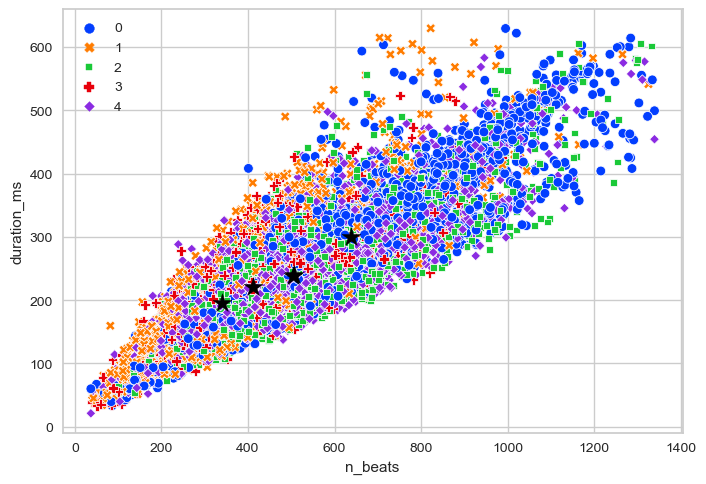

In [95]:
sns.scatterplot(data=dk, 
                x="n_beats", 
                y="duration_ms", 
                hue=bkmeans.labels_, 
                style=bkmeans.labels_,
                palette="bright",)
plt.legend()
plt.scatter(centers[:,11], centers[:,0], c='black', marker='*', s=200)
plt.show()

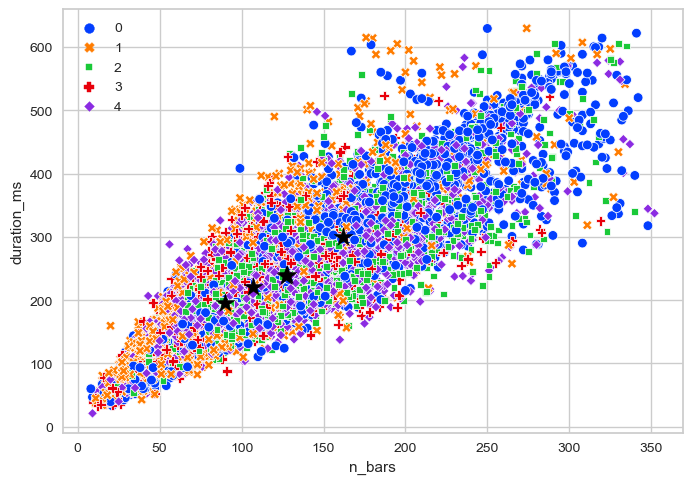

In [96]:
sns.scatterplot(data=dk, 
                x="n_bars", 
                y="duration_ms", 
                hue=bkmeans.labels_, 
                style=bkmeans.labels_,
                palette="bright",)
plt.legend()
plt.scatter(centers[:,12], centers[:,0], c='black', marker='*', s=200)
plt.show()

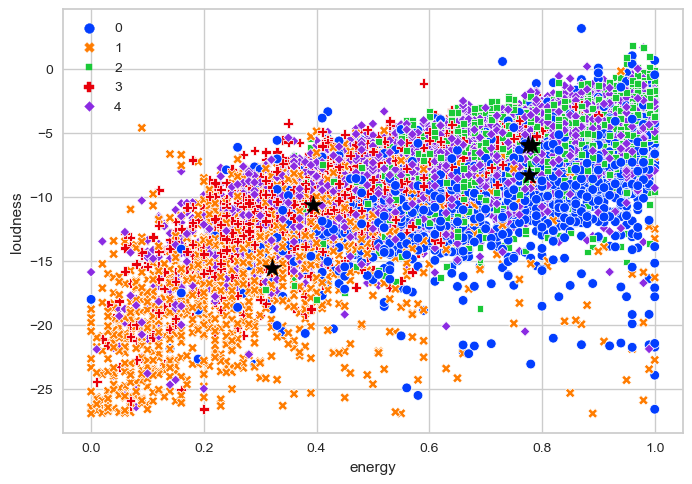

In [97]:
sns.scatterplot(data=dk, 
                x="energy", 
                y="loudness", 
                hue=bkmeans.labels_, 
                style=bkmeans.labels_,
                palette="bright",)
plt.legend()
plt.scatter(centers[:,2], centers[:,3], c='black', marker='*', s=200)
plt.show()

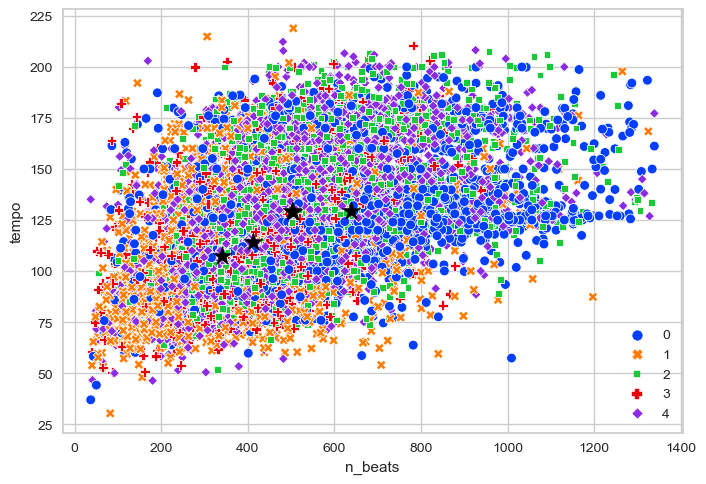

In [98]:
sns.scatterplot(data=dk, 
                x="n_beats", 
                y="tempo", 
                hue=bkmeans.labels_, 
                style=bkmeans.labels_,
                palette="bright",)
plt.legend()
plt.scatter(centers[:,11], centers[:,9], c='black', marker='*', s=200)
plt.show()

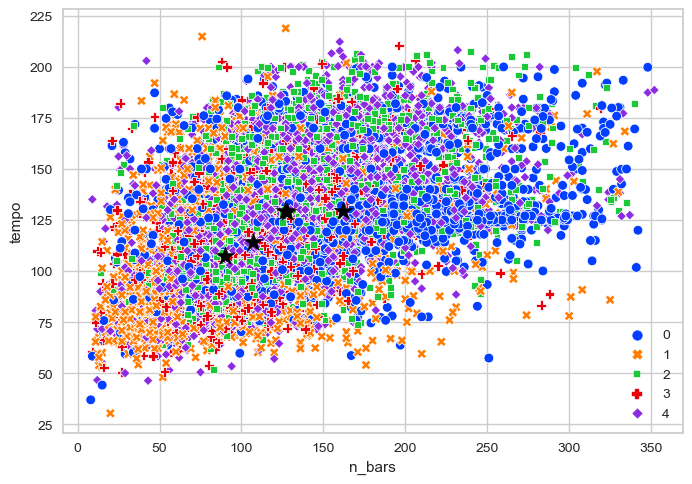

In [99]:
sns.scatterplot(data=dk, 
                x="n_bars", 
                y="tempo", 
                hue=bkmeans.labels_, 
                style=bkmeans.labels_,
                palette="bright",)
plt.legend()
plt.scatter(centers[:,12], centers[:,9], c='black', marker='*', s=200)
plt.show()

## DBSCAN

In [114]:
dbscan = DBSCAN(eps=0.5, min_samples=10)
dbscan.fit(X_minmax)

DBSCAN(min_samples=10)

In [115]:
dbscan.labels_

array([0, 0, 0, ..., 0, 0, 0])

In [116]:
print('Silhouette', silhouette_score(X_minmax, dbscan.labels_))

Silhouette 0.19719223195654637


In [117]:
silhouette_score(X_minmax, dbscan.labels_)

0.19719223195654637

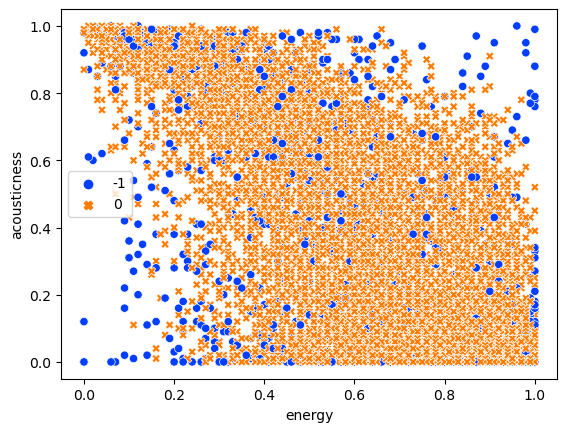

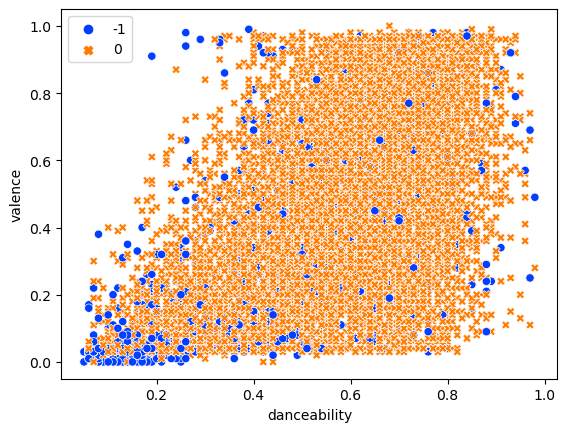

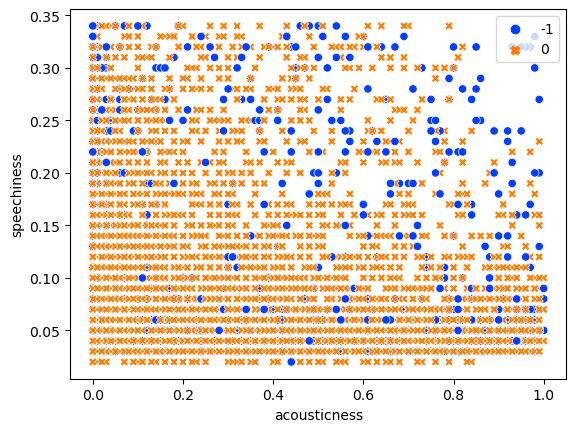

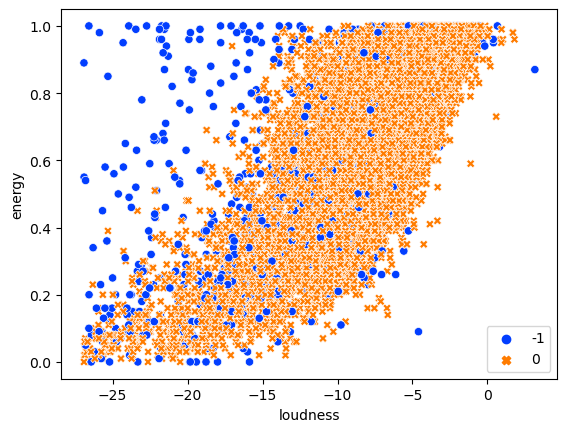

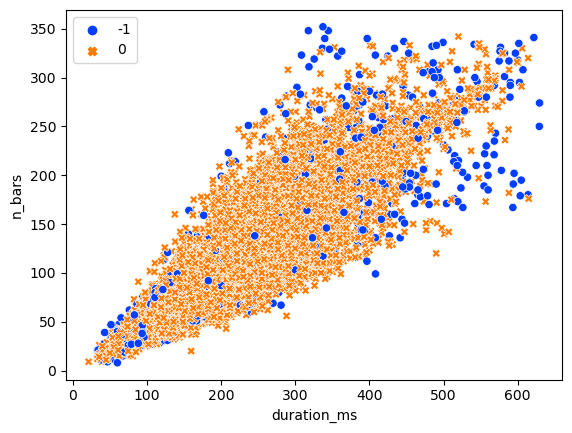

In [28]:
sns.scatterplot(data=dk, 
                x="energy", 
                y="acousticness", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()


sns.scatterplot(data=dk, 
                x="danceability", 
                y="valence", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()


sns.scatterplot(data=dk, 
                x="acousticness", 
                y="speechiness", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

sns.scatterplot(data=dk, 
                x="loudness", 
                y="energy", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

sns.scatterplot(data=dk, 
                x="duration_ms", 
                y="n_bars", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()


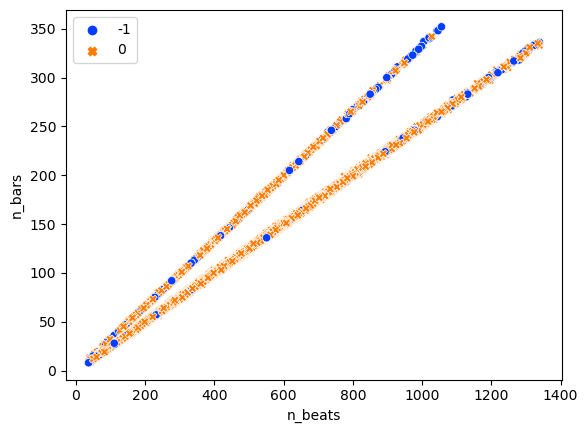

In [29]:
sns.scatterplot(data=dk, 
                x="n_beats", 
                y="n_bars", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()


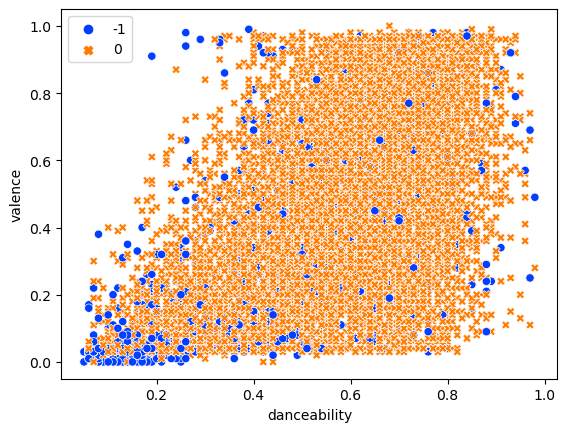

In [30]:
sns.scatterplot(data=dk, 
                x="danceability", 
                y="valence", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()


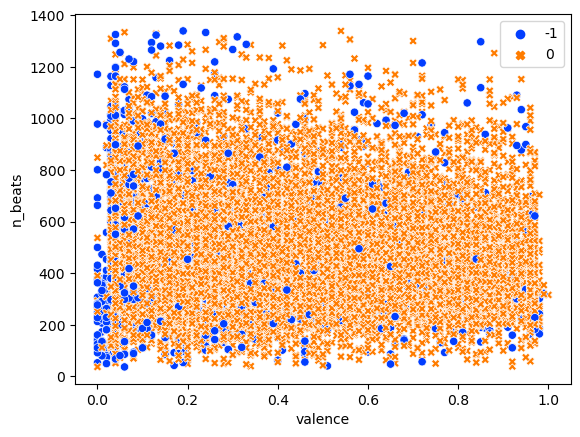

In [31]:
sns.scatterplot(data=dk, 
                x="valence", 
                y="n_beats", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()


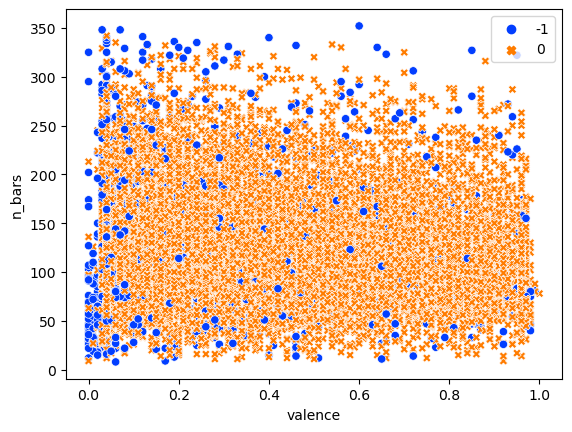

In [32]:
sns.scatterplot(data=dk, 
                x="valence", 
                y="n_bars", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

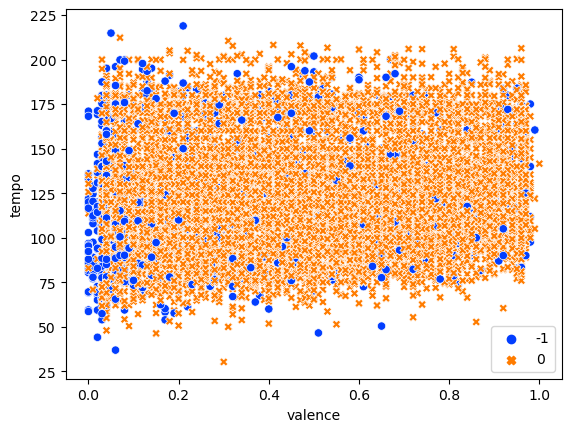

In [33]:
sns.scatterplot(data=dk, 
                x="valence", 
                y="tempo", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()

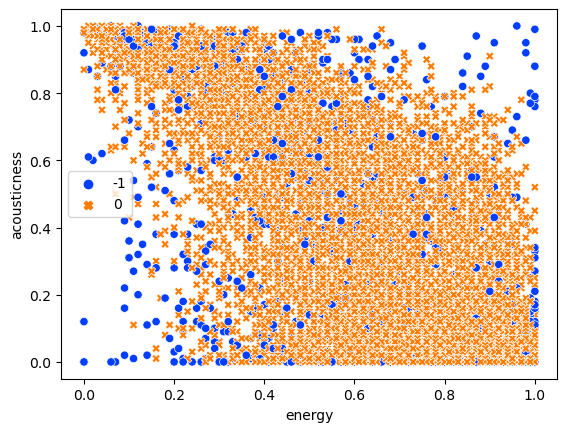

In [34]:
sns.scatterplot(data=dk, 
                x="energy", 
                y="acousticness", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()


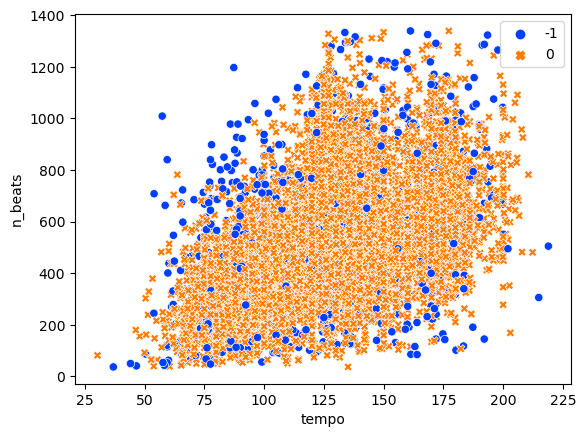

In [35]:
sns.scatterplot(data=dk, 
                x="tempo", 
                y="n_beats", 
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")
plt.show()


## kt neighbor

In [36]:
dist = pdist(X_minmax, 'euclidean')
dist = squareform(dist)

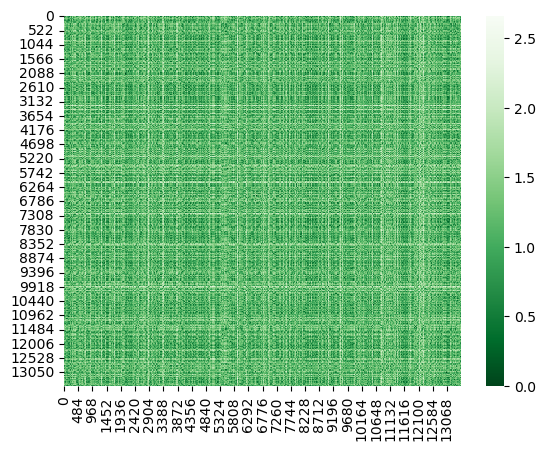

In [37]:
sns.heatmap(dist, cmap="Greens_r", annot=False)
plt.show()

In [38]:
k=4
kth_distances = [] #si misurano le distanze tra ogni punto
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances.append(d[index_kth_distance])  # store the distance in a list

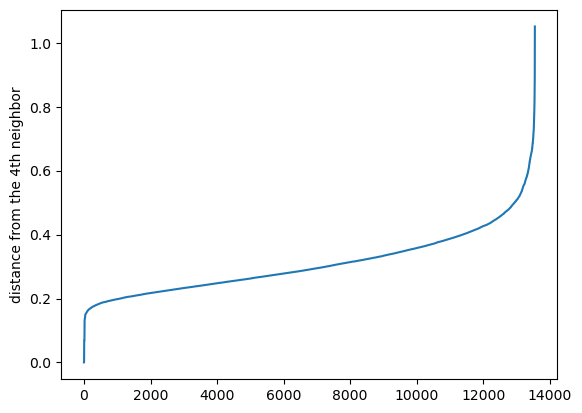

In [39]:
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('distance from the {}th neighbor'.format(k))
         
plt.show()

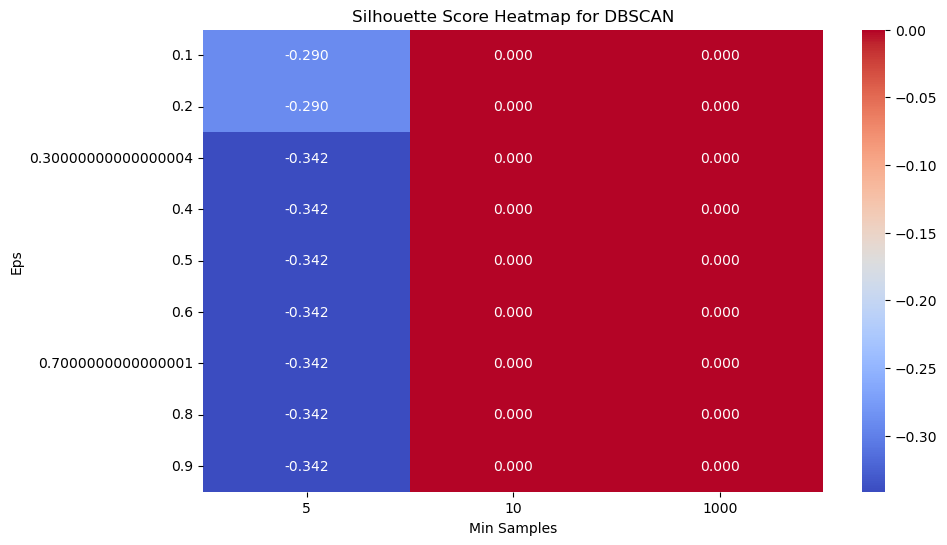

In [40]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Crea una griglia di valori di eps e min_samples da testare
eps_values = np.arange(0.1, 1.0, 0.1)  # Esempio di valori eps
min_samples_values = [5, 10, 1000]  # Esempio di valori min_samples

# Inizializza una matrice per memorizzare i Silhouette Scores
silhouette_scores = np.zeros((len(eps_values), len(min_samples_values)))

# Esegui il clustering per diverse combinazioni di parametri
for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X)
        
        if len(set(labels)) > 1:
            silhouette_avg = silhouette_score(X, labels)
            silhouette_scores[i, j] = silhouette_avg

# Crea un grafico heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(silhouette_scores, annot=True, fmt='.3f', cmap='coolwarm',
            xticklabels=min_samples_values, yticklabels=eps_values)
plt.xlabel('Min Samples')
plt.ylabel('Eps')
plt.title('Silhouette Score Heatmap for DBSCAN')
plt.show()


## Hierarchical

In [90]:
def get_linkage_matrix(model):
    # Create linkage matrix 
    
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    return linkage_matrix

def plot_dendrogram(model, **kwargs):
    linkage_matrix = get_linkage_matrix(model)
    dendrogram(linkage_matrix, **kwargs)

In [93]:
# setting distance_threshold=0 ensures we compute the full tree.
# it is the linkage distance threshold above which clusters will not be merged
#model = AgglomerativeClustering(distance_threshold=0, n_clusters=None,  ##all'inizio non specifichiamo i cluster che vogliamo
                               # metric='euclidean', linkage='complete')
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage='complete', affinity='euclidean')

model = model.fit(X_minmax)

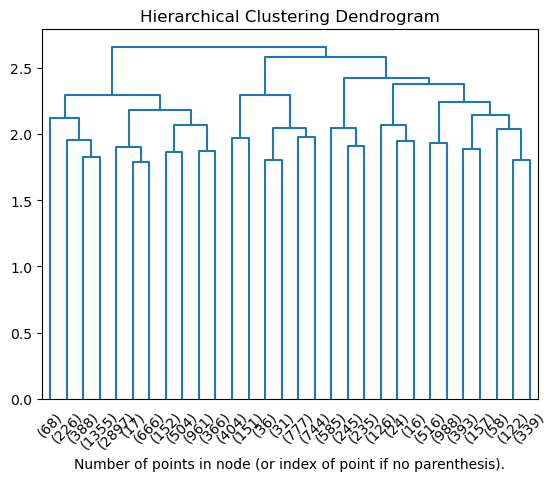

In [94]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode='lastp', color_threshold=1.4)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [121]:
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=2.6, criterion='distance')

In [122]:
labels

array([2, 2, 2, ..., 2, 1, 1], dtype=int32)

In [123]:
print('Silhouette', silhouette_score(X_minmax, labels))

Silhouette 0.16152622138894068


## choosing number of clusters

In [168]:
hier = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='complete')
hier.fit(X_minmax)

AgglomerativeClustering(linkage='complete', n_clusters=4)

In [169]:
hier.labels_

array([3, 0, 2, ..., 2, 1, 1])

## precomputed distance matrix

In [170]:
hier = AgglomerativeClustering(n_clusters=4, affinity='precomputed', linkage='complete')
hier.fit(dist) 

AgglomerativeClustering(affinity='precomputed', linkage='complete',
                        n_clusters=4)

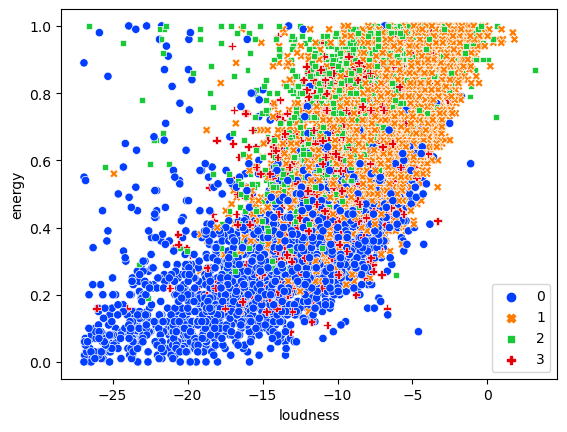

In [171]:
sns.scatterplot(data=dk, 
                x="loudness",
                y="energy", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

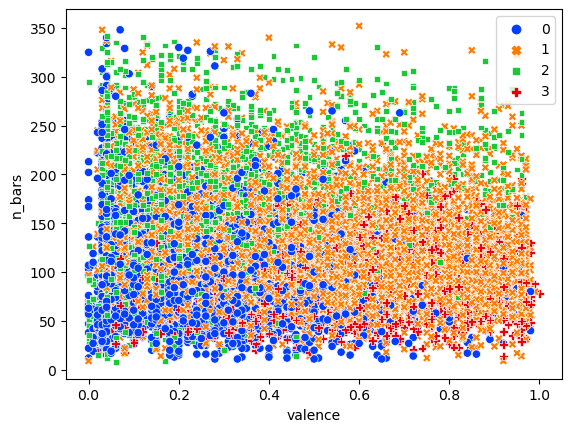

In [172]:
sns.scatterplot(data=dk, 
                x="valence",
                y="n_bars", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

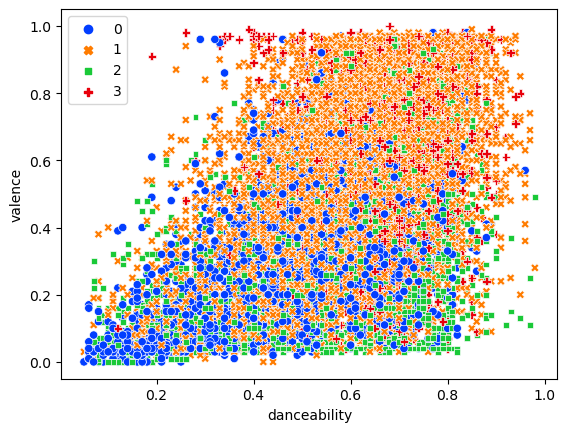

In [173]:
sns.scatterplot(data=dk, 
                x="danceability",
                y="valence", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

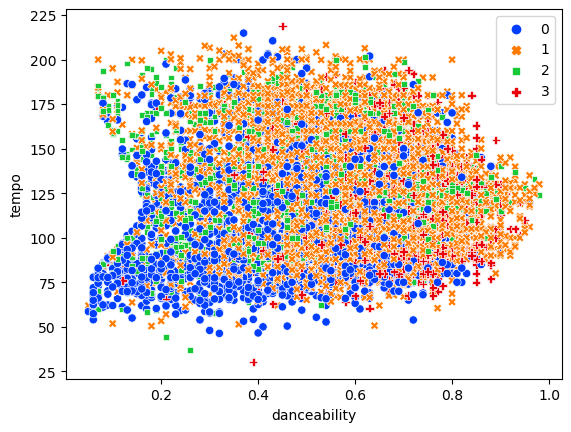

In [174]:
sns.scatterplot(data=dk, 
                x="danceability",
                y="tempo", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

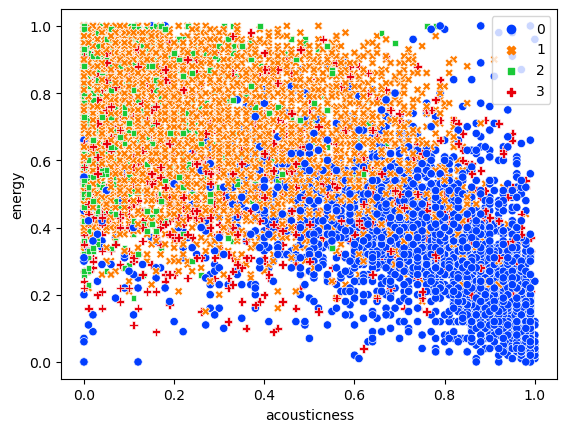

In [175]:
sns.scatterplot(data=dk, 
                x="acousticness",
                y="energy", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

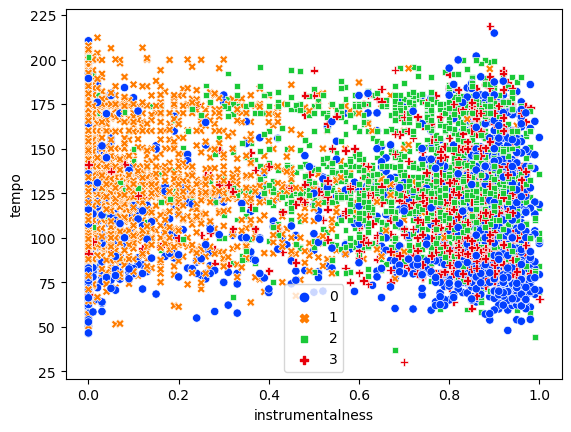

In [176]:
sns.scatterplot(data=dk, 
                x="instrumentalness",
                y="tempo", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

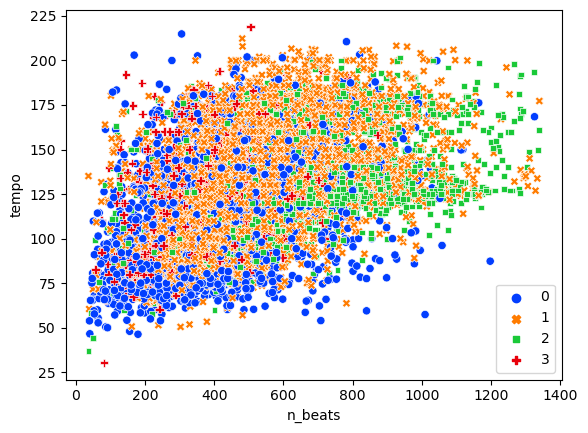

In [177]:
sns.scatterplot(data=dk, 
                x="n_beats",
                y="tempo", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

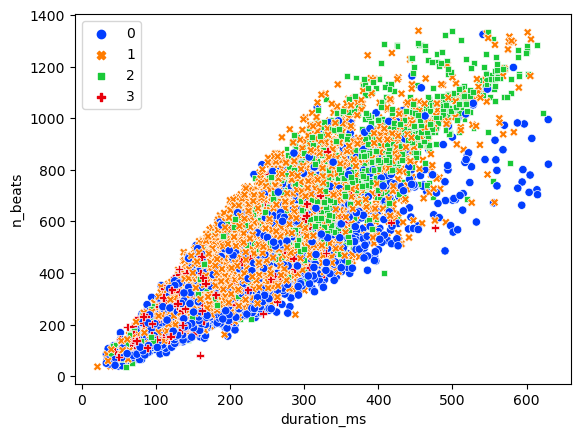

In [178]:
sns.scatterplot(data=dk, 
                x="duration_ms",
                y="n_beats", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

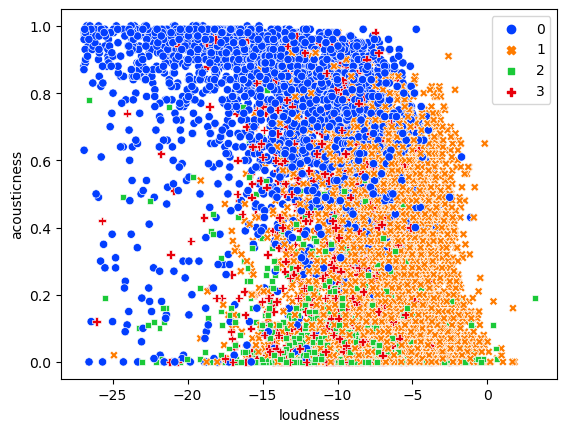

In [179]:
sns.scatterplot(data=dk, 
                x="loudness",
                y="acousticness", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

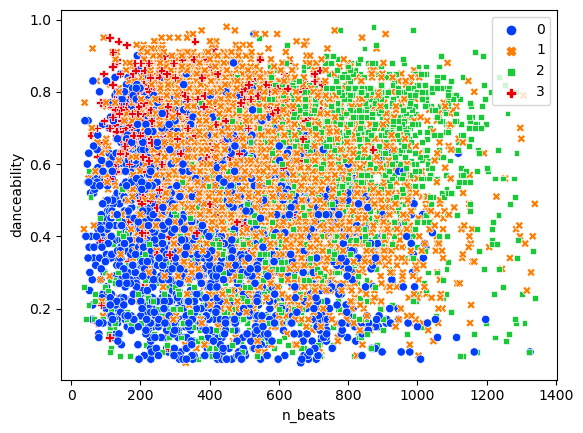

In [180]:
sns.scatterplot(data=dk, 
                x="n_beats",
                y="danceability", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

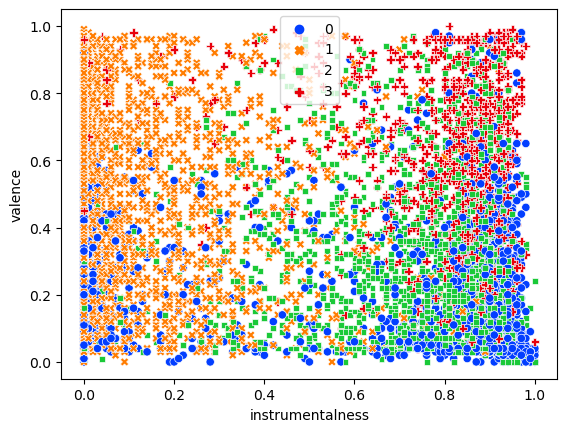

In [181]:
sns.scatterplot(data=dk, 
                x="instrumentalness",
                y="valence", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

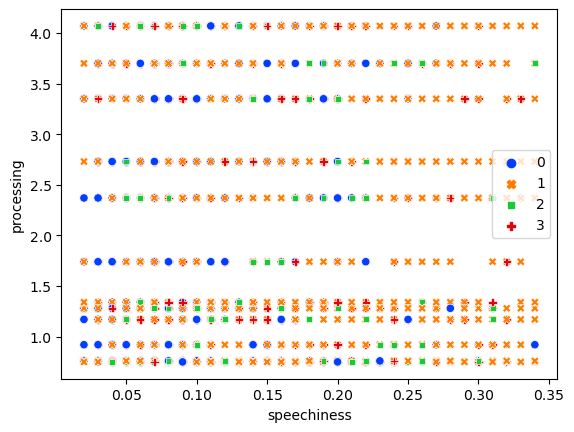

In [182]:
sns.scatterplot(data=dk, 
                x="speechiness",
                y="processing", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

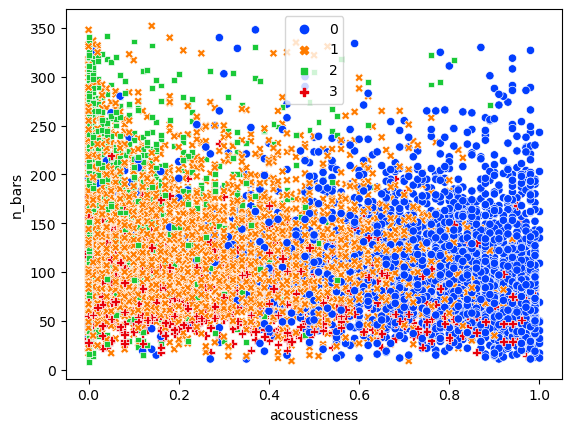

In [183]:
sns.scatterplot(data=dk, 
                x="acousticness",
                y="n_bars", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()